#  Python intro: a super short course 

# Robert Breton

1. What is Python?

2. Why use Python?

3. What can I realistically teach you within an hour? (very short overview..) 

4. Using Jupyter Notebooks (there are other tools..) 


# Why the name 'python'?

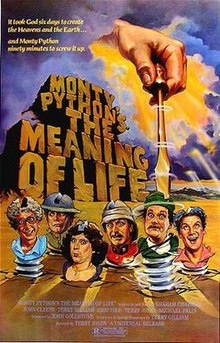

### Why use python?

* Flexible programming language, open source, easy to read, lots of modules, user friendly data structures

* Key technology in itself for reading data, wrangling data, analysing.. visualising (lets you build reproducible analytical pipelines)




# Are there any other reasons for learning python?

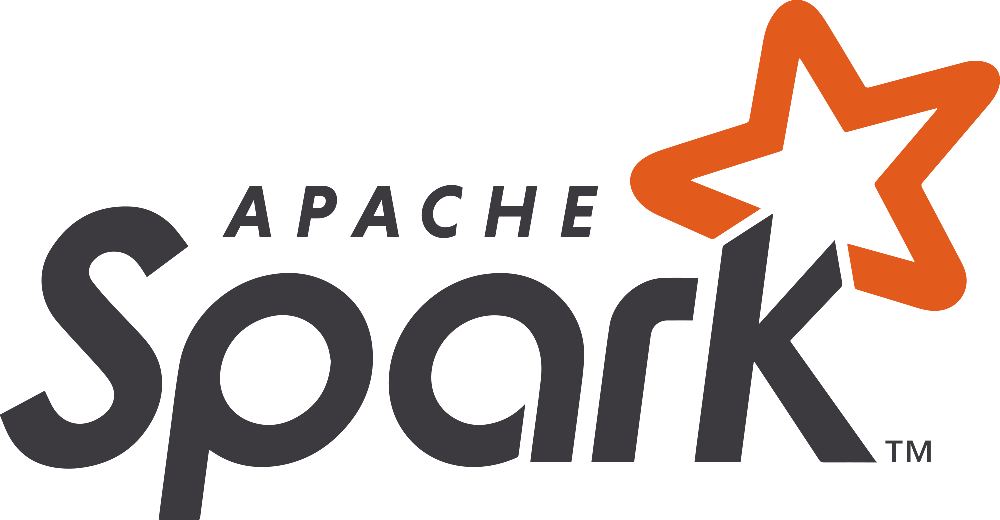

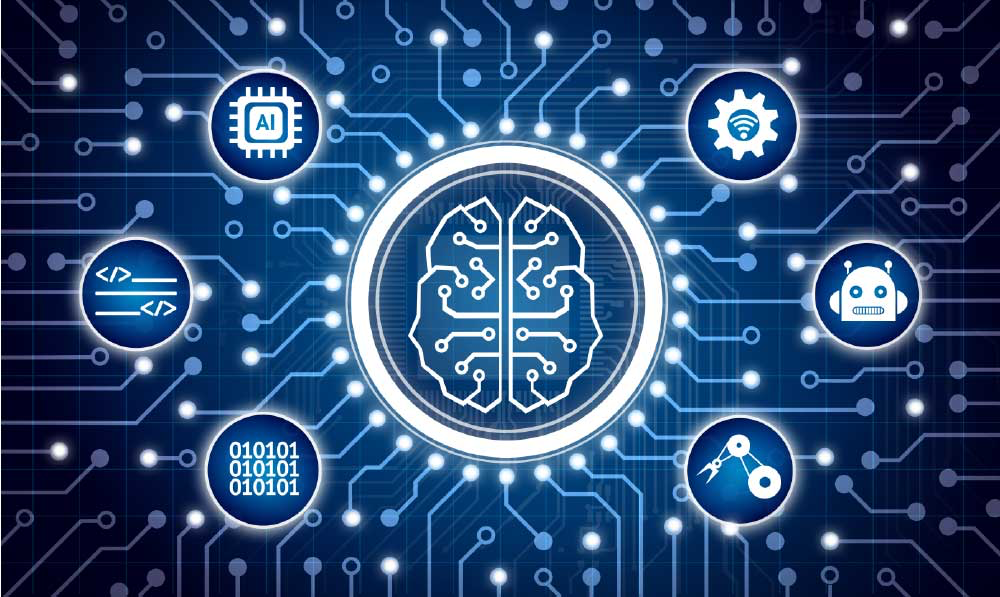

### What can I teach you within an hour?

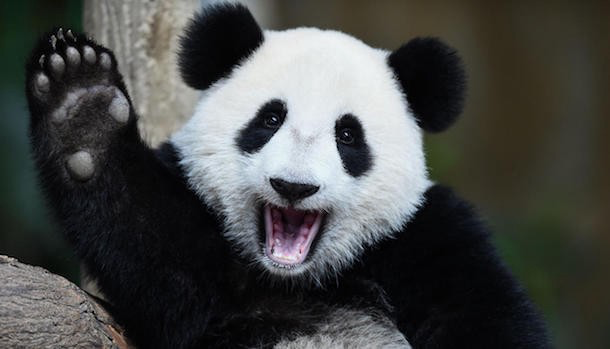

# What is pandas? 

### Who has used excel before? 

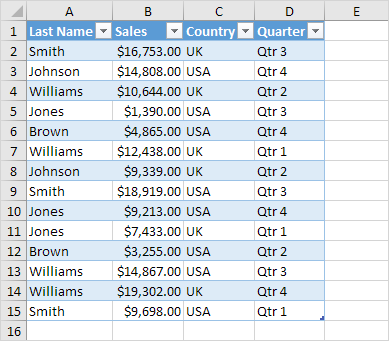

**Pandas**
* Gives us a tabular representation of the data 
* Gives us a collection of methods for working with tabular data

### A fast overview of pandas

1. Lets import pandas (module commonly used with table manipulation) 
2. Lets start working with dataframe objects (this is our pandas table)  
3. Create dataframes .. read csvs etc (easy) 
4. Common dataframe methods (present a few short examples): 
    * filtering 
    * merging 
    * pivot/melt 
    * create new features 
    * groupby 
    * graph 


# Import the pandas module 

In [96]:
#lets get started.. there are several ways to import modules..
#I'll cover one of the most common 
#this is a widely used convention .. alias 
import pandas as pd 
#this particular piece of code allows us to print charts in cells of the notebook
%matplotlib inline

# Create a (pandas) dataframe 

In [97]:
#create a simple dataframe object, setting the index and columns
#tend to create dataframes to perform tests.. 
#index represents the rows 
#columns is more obvious 
#each list object is a row from the table.. 
df = pd.DataFrame(
    [[4, 7, 10,'wales'],
    [5, 8, 11,'wales'],
    [6, 9, 12,'england'],
    [5,5,5,'england']],
    index=[1, 2, 3,4],
    columns=['sales', 'revenue', 'profit','location'])

### Lets look at the data: the first method

In [98]:
#first few lines of a dataframe 
#in order to do this we apply the first method 
#look at the '.' .. methods tend follow dots
df.head()

,sales,revenue,profit,location
1,4,7,10,wales
2,5,8,11,wales
3,6,9,12,england
4,5,5,5,england


# Read a file to create a Dataframe

However.. as a guess, it is more likely that you will be reading data as opposed to creating it 

### But first.. a bit of UNIX 

In order to read in some data:
* we need to know **where** we are.. and more importantly **where** the data files are located!! 
* A good way to do this is to use some **'unix'** like commands. 

### Where am I? 

In [99]:
#location where am I? 
# Run this unix to get the working directory (as an absolute file path)
# print working directory 
%pwd

'/Users/robertfixbreton'

In [95]:
#what is in my local directory.. lets list it out.. 
%ls

Applications/
Desktop/
Documents/
Downloads/
Example Workflow/
Google Drive/
Library/
Movies/
Music/
NLP_pipe_spacy/
Pictures/
Public/
Radiator-master/
Radiator-master 2/
Radiator-master.zip
Scala/
Spark-The-Definitive-Guide/
admin/
intro to python training/
intro to python training-20180928T095536Z-001.zip
newquest
openblas/
training/
wekafiles/


## Let's change directory to 'data'

In [9]:
# change directories to data
%cd data

/Users/robertfixbreton/intro to python training/data


In [33]:
#locate the file we want... hotel reviews 
%ls 

Datafiniti_Hotel_Reviews.csv* states.csv
housing.csv*


# Reading Data

Now that you've loaded **pandas**, and have know where the data is **located**: lets **read** some data into pandas and see what that looks like.

Pandas can read data in a **variety** of different formats. In the code cell below type pd.read then press **Tab**

Pressing Tab gives you all the things you can do with pandas that start with read. You probably recognise some of the data input types (e.g. Excel, SAS, Stata), while others you may not have heard of (e.g. pickle, json etc.) You can then select whichever method you wish to use.

HINT: **Tab** is a really useful shortcut to know for finding or completing commands in notebooks. 

#### Meta data 
1. id
2. dateAdded
3. dateUpdated
4. address
5. categories

25. websites

#### Source  
https://www.kaggle.com/datafiniti/hotel-reviews#Datafiniti_Hotel_Reviews.csv


In [19]:
# Create a variable to hold the relative file path as text
filepath = 'Datafiniti_Hotel_Reviews.csv'

# Create a variable which will hold the data, hotel reviews 
# Use pd.read_csv to read the file, passing the filepath variable that we made above.
df_hotel_reviews = pd.read_csv(filepath)

# Finally, have a look at the first 5 rows 
df_hotel_reviews[['name','dateAdded','reviews.rating',
                  'reviews.text','country','province']].head()

,name,dateAdded,reviews.rating,reviews.text,country,province
0,Rancho Valencia Resort Spa,2016-10-30T21:42:42Z,5.0,Our experience at Rancho Valencia was absolute...,US,CA
1,Rancho Valencia Resort Spa,2016-10-30T21:42:42Z,5.0,Amazing place. Everyone was extremely warm and...,US,CA
2,Rancho Valencia Resort Spa,2016-10-30T21:42:42Z,5.0,We booked a 3 night stay at Rancho Valencia to...,US,CA
3,Aloft Arundel Mills,2015-11-28T19:19:35Z,2.0,Currently in bed writing this for the past hr ...,US,MD
4,Aloft Arundel Mills,2015-11-28T19:19:35Z,5.0,I live in Md and the Aloft is my Home away fro...,US,MD


## Cut down the variables 

In [25]:
#cut down the variables .. create a new dataframe from the oringinal 
df_hotels_short = df_hotel_reviews[['name','dateAdded','reviews.rating',
                                    'reviews.text','country','province']]

# Basic Numerical Descriptive Stats 

Lets find out a bit about the data 

In [26]:
#some quick stats 
#min, max, mean, median, len
#why is it only showing one column? 
df_hotels_short.describe()

,reviews.rating
count,10000.000000
mean,4.034265
std,1.162240
min,1.000000
25%,3.350000
50%,4.000000
75%,5.000000
max,5.000000


## Describing Text (Categorical) Data

We can still use describe() to look at text data, however we need to specify that we're looking at object (text) data types.

In this case, much of our text data actually belong to categories which have been defined as text. Really, the descriptive statistics below are for **categorical data**, they don't work very well if every value in a field is a different piece of text!

In [27]:
# In the describe parameters we're only chosing to include object datatypes, given by 'O'.
# The 'O' is in a list, because we could include other data types in the list if we wanted
df_hotels_short.describe(include=['O'])

,name,dateAdded,reviews.text,country,province
count,10000,10000,9999,10000,10000
unique,1670,1788,9981,1,49
top,Metro Points Hotel-Washington North,2016-06-04T22:46:03Z,Great,US,VA
freq,202,202,6,10000,1096


When you are describing an object you get some different summary statistics than with numerical data:

* **count** as before, a count of the values present in each column.
* **unique** a count of the number of unique values in each column.
* **top** is the most common value - aka the mode.
* **freq** is the frequency of occurance of the most common value.

Note that the most common province is VA 


# Filter observations (rows)

There are many ways to select or subset rows from a dataframe. Here are some common methods 

* df[df.a > 7]
* df.drop_duplicates()
* df.head(n)
* df.tail(n)
* df.sample(n=10)

* df.iloc[10:20] Select rows by position.


In [100]:
#random sample (useful with large datasets)
df_hotels_short.sample(5)

,name,dateAdded,reviews.rating,reviews.text,country,province,Abbreviation
6261,Best Western Luxury Inn,2016-11-03T00:49:27Z,3.0,Uneventful and fine except I was told they cou...,US,CA,CA
132,The Boxer,2017-11-06T20:51:12Z,4.6,Bad: The pillows were very flat and uncomforta...,US,MA,MA
5419,Best Western Plus Virginia Beach,2017-12-22T21:02:56Z,4.0,"The hotel location is good, the employees very...",US,VA,VA
8802,Red Roof Inn Tallahassee,2016-11-07T18:17:30Z,1.0,Just needed a place to stay for the night. Not...,US,FL,FL
2904,The Chocolate Turtle Bed & Breakfast,2017-03-25T18:08:11Z,5.0,The Chocolate Turtle may be the best b b I hav...,US,NM,NM


In [28]:
#Extract rows that meet logical criteria.
df_hotels_short[(df_hotels_short['reviews.rating'] > 4) 
           & (df_hotels_short['province'] == 'VA')].head(3)

,name,dateAdded,reviews.rating,reviews.text,country,province
2045,Hampton Inn Potomac Mills/Woodbridge,2016-05-09T18:05:45Z,5.0,"As a traveling superintendent ,I was there for...",US,VA
2047,Hampton Inn Potomac Mills/Woodbridge,2016-05-09T18:05:45Z,5.0,The staff and the level of service at this Ham...,US,VA
2352,Hilton Garden Inn Williamsburg,2017-07-19T22:24:30Z,4.6,Bad: Would have enjoyed a restaurant in the ho...,US,VA


In [29]:
#Randomly select n rows
df_hotels_short.sample(n=2)

,name,dateAdded,reviews.rating,reviews.text,country,province
8732,Best Western Cooper's Mill Hotel,2016-10-19T05:14:26Z,4.0,"This is a great hotel in a quite spot, walking...",US,IA
6526,Baker's Sunset Bay Resort,2016-11-11T17:15:44Z,4.0,Very helpful staff at check in. Stayed in room...,US,WI


# Filter varibles (columns) 

### There are many ways to subset columns 

### Simple
* df[['width','length','species']]      
* df['width'] or df.width 

### Slightly more complex 
* df.filter(regex='regex')              
* df.loc[:,'a':'b']                     
* df.iloc[:,[1,2,5]]                   
* df.loc[df['a'] > 10, ['a','c']]        

In [30]:
#simple example .. by name 
df_hotels_short[['name','reviews.rating']].head(2)

,name,reviews.rating
0,Rancho Valencia Resort Spa,5.0
1,Rancho Valencia Resort Spa,5.0


In [31]:
#combing a logical row operator for the first column 
df_hotels_short.loc[df_hotels_short['reviews.rating'] > 4, 
               ['name','reviews.rating']].head(3)

,name,reviews.rating
0,Rancho Valencia Resort Spa,5.0
1,Rancho Valencia Resort Spa,5.0
2,Rancho Valencia Resort Spa,5.0


In [32]:
#filter by numerical index .. 
#first three rows and the first three columns 
df_hotels_short.iloc[0:3,0:3]

,name,dateAdded,reviews.rating
0,Rancho Valencia Resort Spa,2016-10-30T21:42:42Z,5.0
1,Rancho Valencia Resort Spa,2016-10-30T21:42:42Z,5.0
2,Rancho Valencia Resort Spa,2016-10-30T21:42:42Z,5.0


# Merging (Joining) two tables 

## But first we need another dataframe 

In [34]:
#create another dataframe
# Create a variable to hold the relative file path as text
filepath = 'states.csv'

# Create a variable which will hold the data, call it 'animals'
# Use pd.read_csv to read the file, passing the filepath variable that we made above.
df_states = pd.read_csv(filepath)

In [101]:
df_states.head(4)

,State,Abbreviation
0,Alabama,AL
1,Alaska,AK
2,Arizona,AZ
3,Arkansas,AR


In [50]:
print(df_states.dtypes)

State           object
Abbreviation    object
dtype: object


In [36]:
print(df_hotels_short.dtypes)

name               object
dateAdded          object
reviews.rating    float64
reviews.text       object
country            object
province           object
dtype: object


## ...and to create a feature from an existing feature

In [90]:
#we are creating this feature to match the naming convention on the 
#second table 
df_hotels_short.loc[:,'Abbreviation'] = df_hotels_short.loc[:,'province']
df_hotels_short.head()

/usr/local/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


,name,dateAdded,reviews.rating,reviews.text,country,province,Abbreviation
0,Rancho Valencia Resort Spa,2016-10-30T21:42:42Z,5.0,Our experience at Rancho Valencia was absolute...,US,CA,CA
1,Rancho Valencia Resort Spa,2016-10-30T21:42:42Z,5.0,Amazing place. Everyone was extremely warm and...,US,CA,CA
2,Rancho Valencia Resort Spa,2016-10-30T21:42:42Z,5.0,We booked a 3 night stay at Rancho Valencia to...,US,CA,CA
3,Aloft Arundel Mills,2015-11-28T19:19:35Z,2.0,Currently in bed writing this for the past hr ...,US,MD,MD
4,Aloft Arundel Mills,2015-11-28T19:19:35Z,5.0,I live in Md and the Aloft is my Home away fro...,US,MD,MD


# Back to merging.. the Left join 
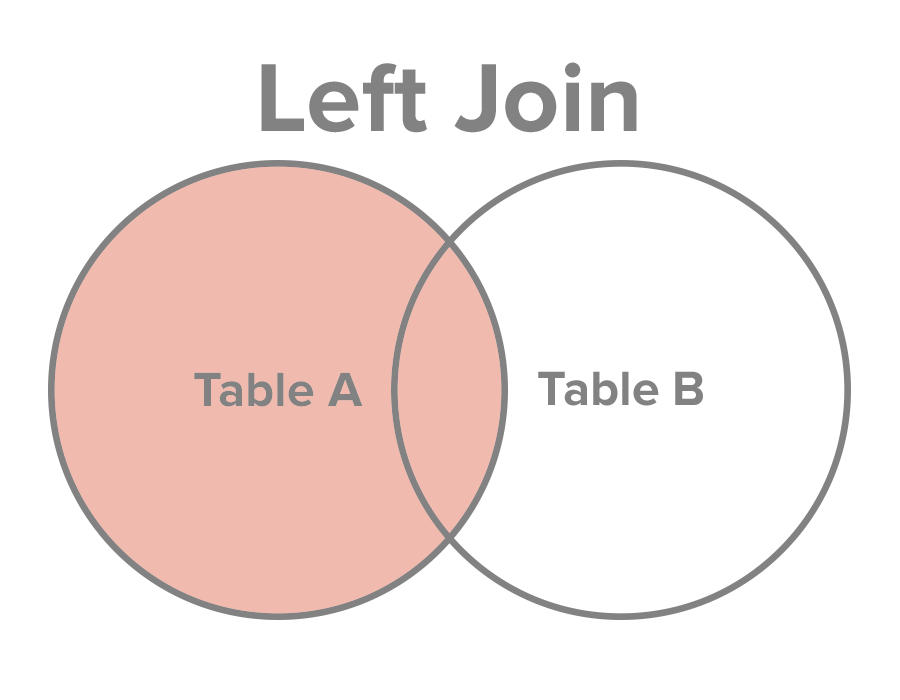

In [51]:
#merge..left, right, outer, inner 
#(dataframes, join result, join expression) 
df_combined = pd.merge(df_hotels_short, df_states, how='left', on='Abbreviation')


In [55]:
df_combined.loc[df_combined['Abbreviation'] == 'VA', 
               ['name','reviews.rating','State','Abbreviation']].head()

,name,reviews.rating,State,Abbreviation
2045,Hampton Inn Potomac Mills/Woodbridge,5.0,Virginia,VA
2046,Hampton Inn Potomac Mills/Woodbridge,3.0,Virginia,VA
2047,Hampton Inn Potomac Mills/Woodbridge,5.0,Virginia,VA
2048,Hampton Inn Potomac Mills/Woodbridge,4.0,Virginia,VA
2049,Hampton Inn Potomac Mills/Woodbridge,4.0,Virginia,VA


# Groupby

In [82]:
#other common groupby methods.. max, min, sum .. 
#groupbys always have an aggregation method 
#summary reviews by state and date 
hotel_review_by_state = df_combined[['reviews.rating','State','dateAdded']]\
                                    .groupby(by=["State","dateAdded"])\
                                    .agg("mean")\
                                    .head(100)

In [84]:
hotel_review_by_state.head(3)

reviews.rating
State  dateAdded                           
Alaska 2015-09-28T05:29:12Z             5.0
       2015-11-07T13:05:57Z             3.0
       2016-03-23T04:23:36Z             4.0

In [85]:
#reset the index to turn it back to a dataframe 
df_hotel_review_by_state = hotel_review_by_state.reset_index()

In [86]:
df_hotel_review_by_state.head(3)

,State,dateAdded,reviews.rating
0,Alaska,2015-09-28T05:29:12Z,5.0
1,Alaska,2015-11-07T13:05:57Z,3.0
2,Alaska,2016-03-23T04:23:36Z,4.0


# Pivot 

### Pivoting Data

To achieve this we can use pandas 'pivot' method to produce a 'pivot table'

    DataFrame.pivot(index =  , columns = , values =  )
    
 Where: 
 
     * index - this is the column from your data that will become the new index
     * columns - this is the column that will be used to create new columns (each unique entry will form a new column)
     * values - this column will form the values of the new columns

In [88]:
#pivot example .. transposing data
df_hotel_review_by_state.pivot(index='dateAdded', 
                               columns = 'State', 
                               values = 'reviews.rating').head(6)

State,Alaska,Arizona,Arkansas,California
dateAdded,,,,
2015-03-03T03:14:16Z,NaN,NaN,NaN,4.5
2015-03-03T03:17:17Z,NaN,NaN,NaN,5.0
2015-09-16T17:12:59Z,NaN,NaN,5.0,NaN
2015-09-21T07:30:20Z,NaN,NaN,5.0,NaN
2015-09-21T08:18:56Z,NaN,NaN,5.0,NaN
2015-09-28T05:29:12Z,5.0,NaN,NaN,NaN


# Data visualistion 

Some simple charts - using a basic plotting package matplotlib: 

* histogram 

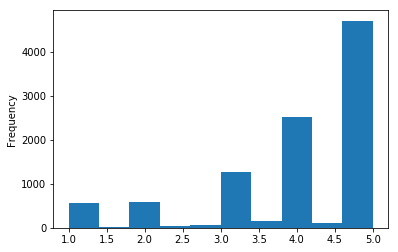

In [58]:
#built in charts ... there are many more vis libraries 
#much more is going to be covered in the case study 
#just to show you the common library 
df_combined['reviews.rating'].plot.hist()

# Saving/Exporting DataFrames

As the final item in this section, lets briefly look at how to export a dataframe.

In [91]:
# Let's export the decriptive dataframe to a file.
# First make the dataframe and assign it to a variable.
df_combined = df_combined.describe()
# Now, let's save this dataframe as a csv in a folder called outputs
df_combined.to_csv('hotel_reviews_descriptives.csv')

## What have we covered? 

1. Importation of modules.. pandas 
2. Working with dataframe objects (this is our pandas table)  
3. Creatation of dataframes .. read csvs ..  
4. Common dataframe methods (present a few short examples): 
    * filtering 
    * merging 
    * pivot
    * create new features 
    * groupby 
    * graph 
    
5. Case study exercise will follow and some resources

# Resources 

Datacamp - introduction courses are free 

Note that these are just a few links.. 

https://www.datacamp.com/

https://www.kaggle.com/learn/overview

Datascience campus and the Learning academy are working together to roll out supporting class room training 

The Data Science Campus: datasciencecampus@ons.gov.uk
Learning Academy: learning.academy@ons.gov.uk

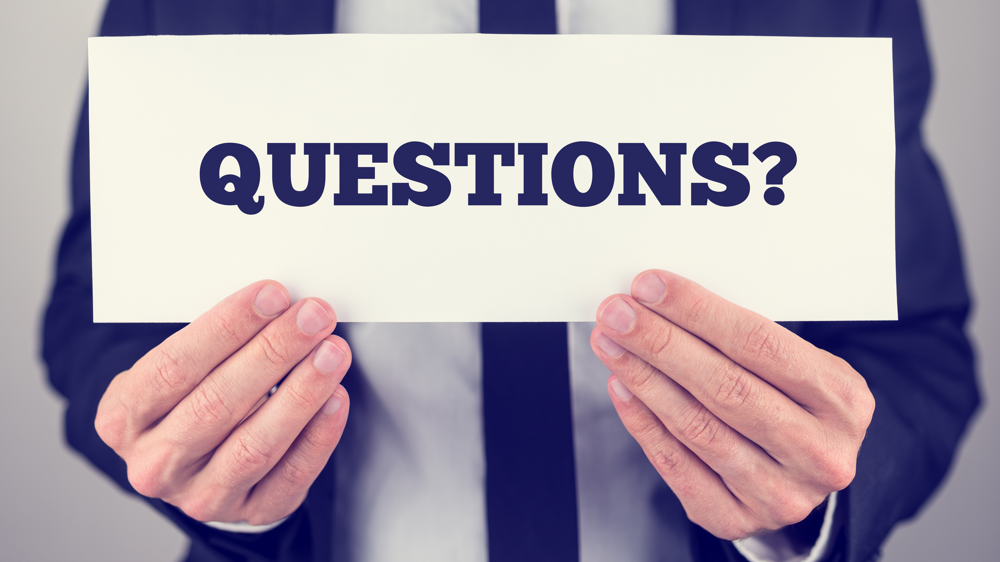